# Questions

In [3]:
from skimage.io import imread, imsave, imshow, show, imread_collection, imshow_collection
import skimage
from skimage import filters
from scipy import misc
from scipy import ndimage
from skimage.transform import SimilarityTransform, warp, swirl
from PIL import Image
from mpl_toolkits.mplot3d import Axes3D
import cv2 



import ipywidgets as widgets
from IPython.display import display
import matplotlib.pyplot as plt
import numpy as np

%matplotlib inline

In [4]:
# some general functions which can be used 

def plot_image_comparison(image1, image2, title1, title2, figsize= (24,8)):
    plt.figure(figsize = figsize)

    plt.subplot(121); plt.imshow(image1); plt.axis("off"); plt.title(title1)
    plt.subplot(122); plt.imshow(image2); plt.axis("off"); plt.title(title2)
    

## Q-1: Use the scikit-image library's functions to read a collection of images and display them as a montage.

In [2]:
# some images are stored inside the folder image_collection
images = imread_collection("image_collection/*.jpeg")

In [3]:
images.files

['image_collection/alien.jpeg',
 'image_collection/banana.jpeg',
 'image_collection/beach.jpeg',
 'image_collection/evening.jpeg',
 'image_collection/kl.jpeg',
 'image_collection/mask.jpeg',
 'image_collection/orange.jpeg',
 'image_collection/potrait2.jpeg',
 'image_collection/potrait.jpeg']

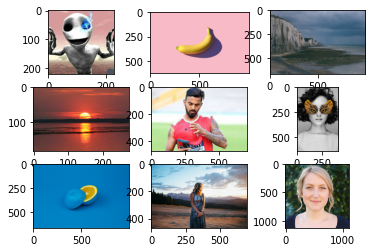

In [4]:
# displaying it using imshow_collection
output = imshow_collection(images)

Maybe We can use matplotlib to plot it better ;D 

## Q-2:  Use the scipy ndimage and misc modules' functions to zoom, crop, resize, and apply Affine transformation to an image.

(-0.5, 1023.5, 767.5, -0.5)

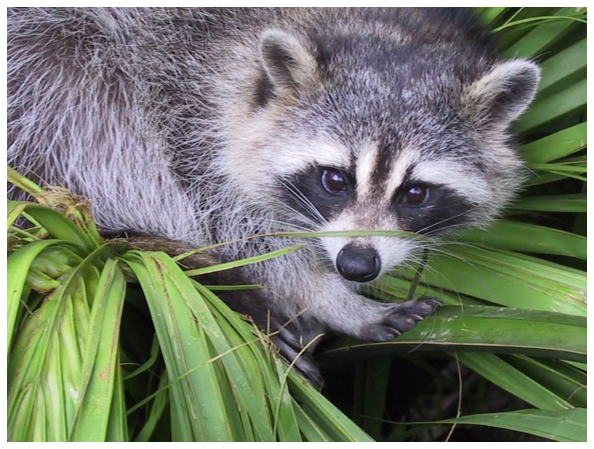

In [5]:
# let's load any image from misc library 
im = misc.face()

plt.figure(figsize = (12,8))
plt.imshow(im)
plt.axis('off')

### Zoom

In [6]:
zoomed_image = ndimage.zoom(im, [3,3,1])

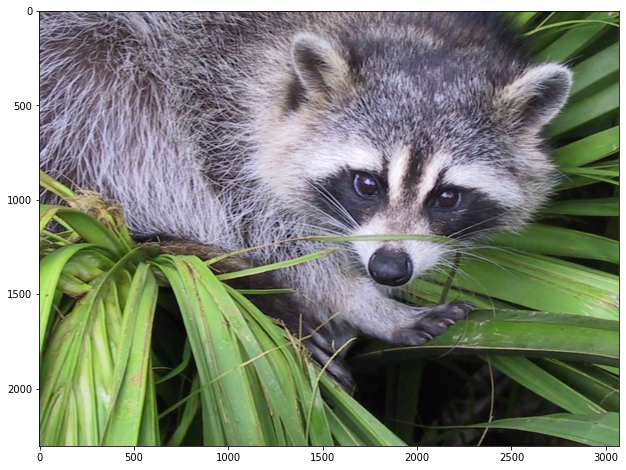

In [7]:
plt.figure(figsize = (12,8))
plt.imshow(zoomed_image)

In [8]:
print("Shape of the image before zoom - {}".format(im.shape))
print("Shape of the image after zoom  - {}".format(zoomed_image.shape))

Shape of the image before zoom - (768, 1024, 3)
Shape of the image after zoom  - (2304, 3072, 3)


### Cropping

In [9]:
img_sub = im[80:500, 400:900] # using index slicing

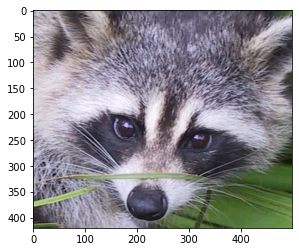

In [10]:
plt.imshow(img_sub)

### Resizing 

In [12]:
resized = misc.imresize(im, (400,600))

AttributeError: module 'scipy.misc' has no attribute 'imresize'

imresize is removed from the current version of scipy.misc

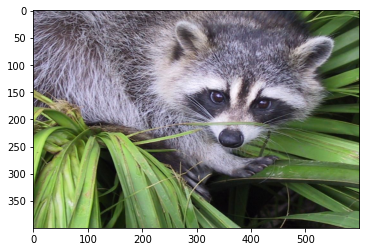

In [13]:
# we have a lots of alternatives though. the best one is to use cv2.resize()
resized = cv2.resize(im, (600,400))

plt.imshow(resized)

### Apply Affine Transformation

In [14]:
from skimage.color import rgb2gray

In [20]:
img_gray = rgb2gray(im)
w, h = img_gray.shape

mat_identity = np.array([[1,0,0],[0,1,0],[0,0,1]])
img1 = ndimage.affine_transform(img_gray, mat_identity)

In [34]:
s_x, s_y = 0.75, 1.25
mat_scale = np.array([[s_x,0,0],[0,s_y,0],[0,0,1]])
img2 = ndimage.affine_transform(img_gray, mat_scale)

In [35]:
theta = np.pi/6
mat_rotate = np.array([[1,0,w/2],[0,1,h/2],[0,0,1]]) @ np.array([[np.cos(theta),np.sin(theta),0],[np.sin(theta),-np.cos(theta),0],[0,0,1]]) @ np.array([[1,0,-w/2],[0,1,-h/2],[0,0,1]])
img3 = ndimage.affine_transform(img1, mat_rotate)

In [36]:
lambda1 = 0.5
mat_shear = np.array([[1,lambda1,0],[lambda1,1,0],[0,0,1]])
img4 = ndimage.affine_transform(img1, mat_shear)

(-0.5, 1023.5, 767.5, -0.5)

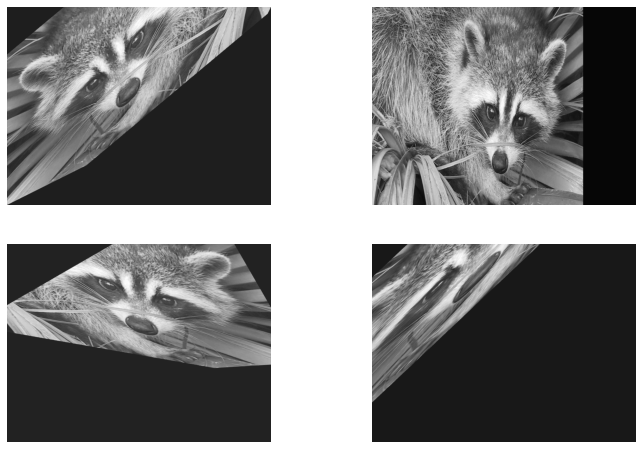

In [40]:
plt.figure(figsize = (12,8))
plt.subplot(221);plt.imshow(img1, cmap="gray"); plt.axis('off')
plt.subplot(222);plt.imshow(img2, cmap="gray"); plt.axis('off')
plt.subplot(223);plt.imshow(img3, cmap="gray"); plt.axis('off')
plt.subplot(224);plt.imshow(img4, cmap="gray"); plt.axis('off')

## Q-3: Create a Python remake of the Gotham Instagram filter 

Source - https://github.com/lukexyz/CV-Instagram-Filters/blob/master/gotham.py

In [7]:
print('Instagram Filter Remake: Gotham')
original_image = skimage.io.imread('potrait2.jpeg')
original_image = skimage.util.img_as_float(original_image)


def split_image_into_channels(image):
    """Look at each image separately"""
    red_channel = image[:, :, 0]
    green_channel = image[:, :, 1]
    blue_channel = image[:, :, 2]
    return red_channel, green_channel, blue_channel


def merge_channels(red, green, blue):
    """Merge channels back into an image"""
    return np.stack([red, green, blue], axis=2)

r, g, b = split_image_into_channels(original_image)
im = merge_channels(r, g, b)


def sharpen(image, a, b):
    """Sharpening an image: Blur and then subtract from original"""
    blurred = skimage.filters.gaussian(image, sigma=10, multichannel=True)
    sharper = np.clip(image * a - blurred * b, 0, 1.0)
    return sharper


def channel_adjust(channel, values):
    # preserve the original size, so we can reconstruct at the end
    orig_size = channel.shape
    # flatten the image into a single array
    flat_channel = channel.flatten()
 
    # this magical numpy function takes the values in flat_channel
    # and maps it from its range in [0, 1] to its new squeezed and
    # stretched range
    adjusted = np.interp(flat_channel, np.linspace(0, 1, len(values)), values)

    # put back into the original image shape
    return adjusted.reshape(orig_size)

# 1. Colour channel adjustment example
r, g, b = split_image_into_channels(original_image)
r_interp = channel_adjust(r, [0, 0.8, 1.0])
red_channel_adj = merge_channels(r_interp, g, b)
skimage.io.imsave('images/1_red_channel_adj.jpg', red_channel_adj)

# 2. Mid tone colour boost
r, g, b = split_image_into_channels(original_image)
r_boost_lower = channel_adjust(r, [0, 0.05, 0.1, 0.2, 0.3, 0.5, 0.7, 0.8, 0.9, 0.95, 1.0])
r_boost_img = merge_channels(r_boost_lower, g, b)
skimage.io.imsave('images/2_mid_tone_colour_boost.jpg', r_boost_img)

# 3. Making the blacks bluer
bluer_blacks = merge_channels(r_boost_lower, g, np.clip(b + 0.03, 0, 1.0))
skimage.io.imsave('images/3_bluer_blacks.jpg', bluer_blacks)

# 4. Sharpening the image
sharper = sharpen(bluer_blacks, 1.3, 0.3)
skimage.io.imsave('images/4_sharpened.jpg', sharper)

# 5. Blue channel boost in lower-mids, decrease in upper-mids
r, g, b = split_image_into_channels(sharper)
b_adjusted = channel_adjust(b, [0, 0.047, 0.118, 0.251, 0.318, 0.392, 0.42, 0.439, 0.475, 0.561, 0.58, 0.627, 0.671, 0.733, 0.847, 0.925, 1])
gotham = merge_channels(r, g, b_adjusted)
skimage.io.imsave('images/5_blue_adjusted.jpg', gotham)

Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.
Lossy conversion from float64 to uint8. Range [0, 1]. Convert image to uint8 prior to saving to suppress this warning.


Instagram Filter Remake: Gotham


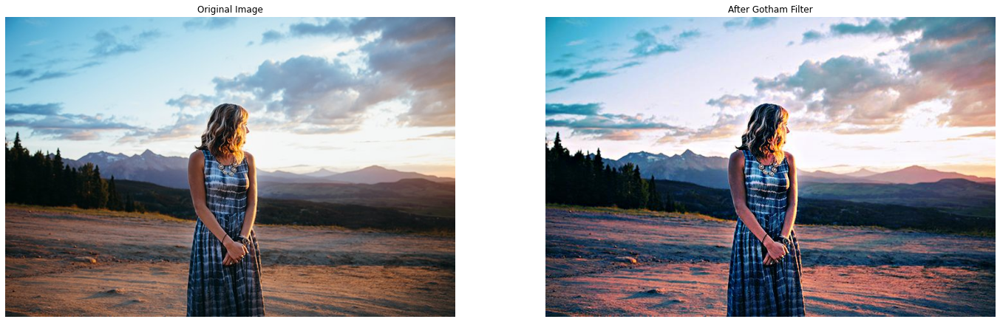

In [8]:
img_original = cv2.imread("potrait2.jpeg")

img_filtered = cv2.imread("images/5_blue_adjusted.jpg")

plot_image_comparison(img_original[:,:,::-1], img_filtered[:,:,::-1], "Original Image", "After Gotham Filter")

## Q-4: Use scikit-image's warp() function to implement the swirl transform. 

The code taken from solutions

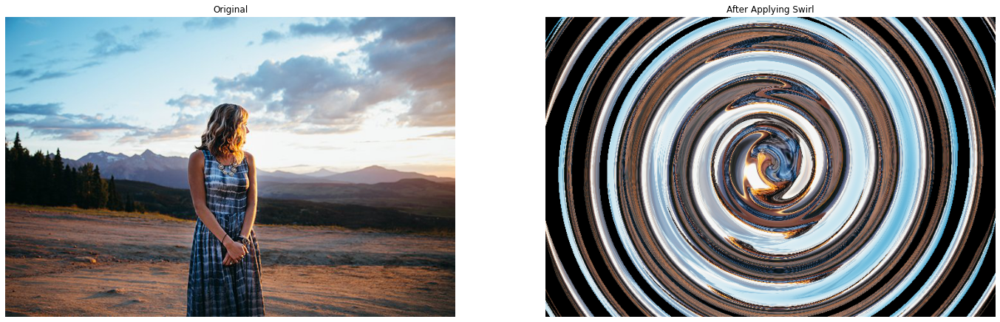

In [9]:
def swirl_fn(xy, x0, y0, R):
    r = np.sqrt((xy[:,1]-x0)**2 + (xy[:,0]-y0)**2)
    a = np.pi * r / R
    xy[:, 1] = (xy[:, 1]-x0)*np.cos(a) + (xy[:, 0]-y0)*np.sin(a) + x0
    xy[:, 0] = -(xy[:, 1]-x0)*np.sin(a) + (xy[:, 0]-y0)*np.cos(a) + y0
    return xy

im = imread('potrait2.jpeg')
im_swirl = warp(im, swirl_fn, map_args={'x0':im.shape[0]//2, 'y0':im.shape[1]//2, 'R':40})

plot_image_comparison(im, im_swirl, "Original", "After Applying Swirl")

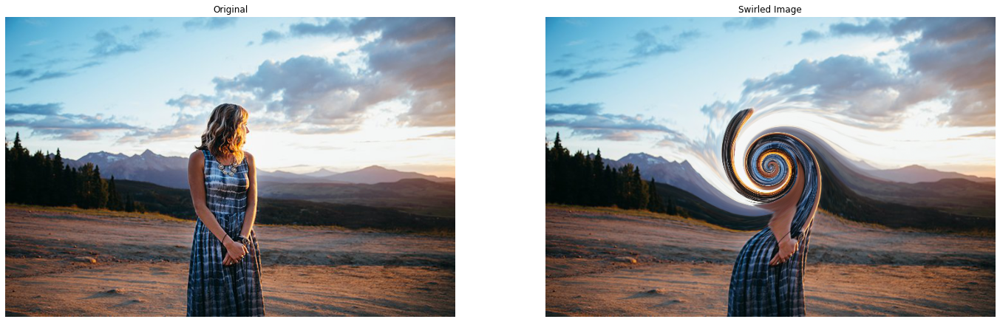

In [10]:
swirled = swirl(im, rotation=0, strength=15, radius=200)

plot_image_comparison(im, swirled, "Original", "Swirled Image")

In [28]:
im.shape

(467, 700, 3)

Not sure how to get control the strength and get output similar to the one we have while using swirl() from skimage.trasnform

## Q-5: Implement the wave transform

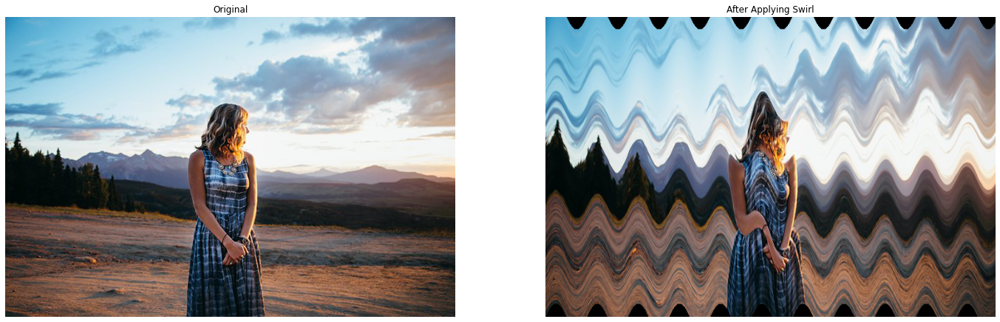

In [54]:
def wave_fn(xy, strength):    
    xy[:, 1] += strength*np.sin(2*np.pi*xy[:, 0]/64)
    return xy

im = imread('potrait2.jpeg')
im_wave = warp(im, wave_fn, map_args={"strength":20})

plot_image_comparison(im, im_wave, "Original", "After Applying Swirl")

With less strength - 


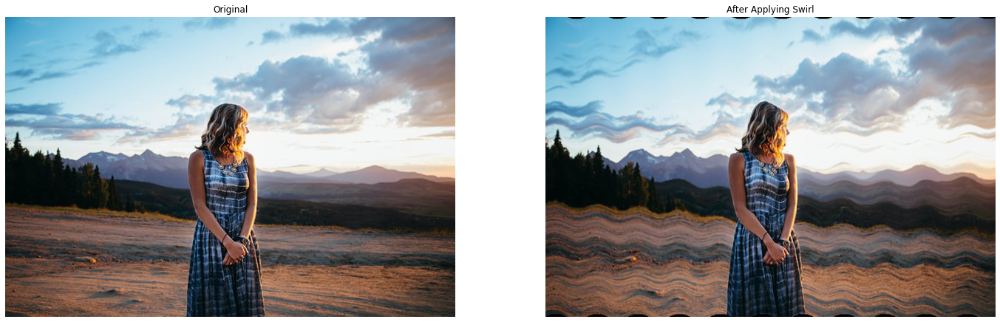

In [57]:
im_wave = warp(im, wave_fn, map_args={"strength":4})

plot_image_comparison(im, im_wave, "Original", "After Applying Swirl")

## Q-6: Use PIL to load an RGB .png file with a palette and convert into a grayscale image. This problem is taken from this post:[this](https://stackoverflow.com/questions/51676447/python-use-pil-to-load-png-file-gives-strange-results/51678271#51678271)  python-​use-​pil-​to-​load-​png-​file-​gives-​strange- results/​51678271#51678271. Convert the following RGB image (from the VOC2012 dataset) into a grayscale image by indexing the palette

In [63]:
img = Image.open("cycling.png")

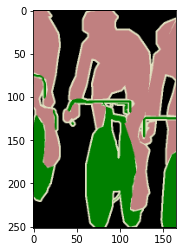

In [62]:
plt.imshow(img)

In [65]:
img_array = np.array(img)
img_array.shape

(252, 165, 3)

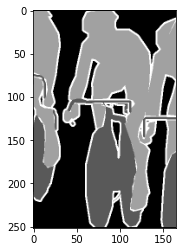

In [67]:
gray = cv2.cvtColor(img_array, cv2.COLOR_BGR2GRAY)
plt.imshow(gray, cmap="gray")

Convert it to numpy arrays and use cv2.cvtColor, works smoothly

## Q-7: Make a 3D plot for each of the color channels of the parrot image used in this chapter

<ipython-input-2-f17817e90cd1>:15: MatplotlibDeprecationWarning: Calling gca() with keyword arguments was deprecated in Matplotlib 3.4. Starting two minor releases later, gca() will take no keyword arguments. The gca() function should only be used to get the current axes, or if no axes exist, create new axes with default keyword arguments. To create a new axes with non-default arguments, use plt.axes() or plt.subplot().
  ax = fig.gca(projection='3d')


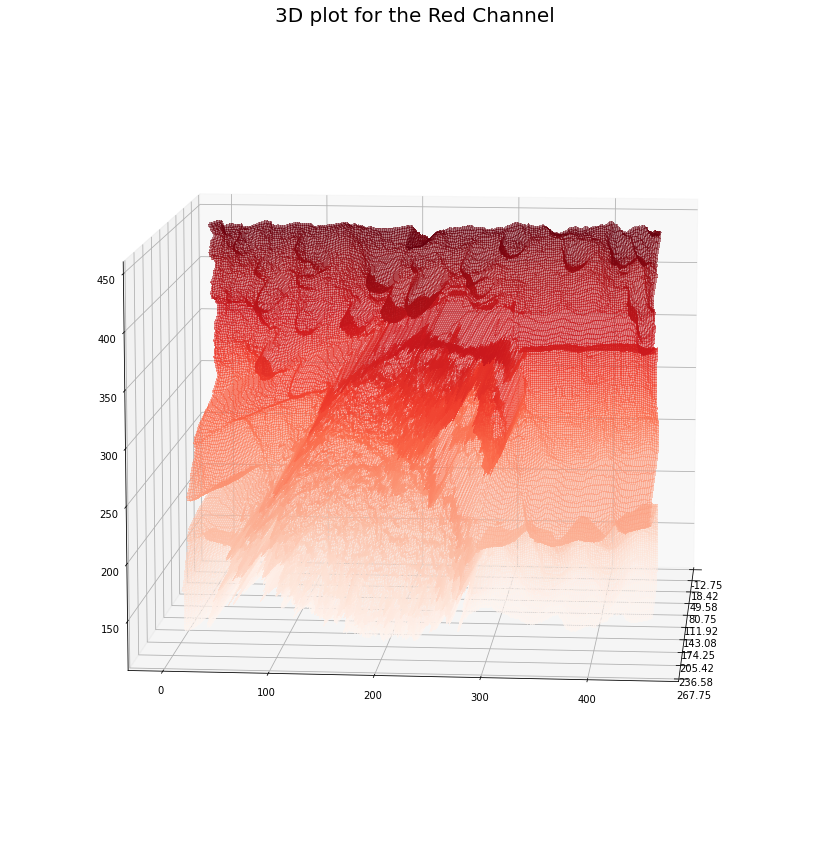

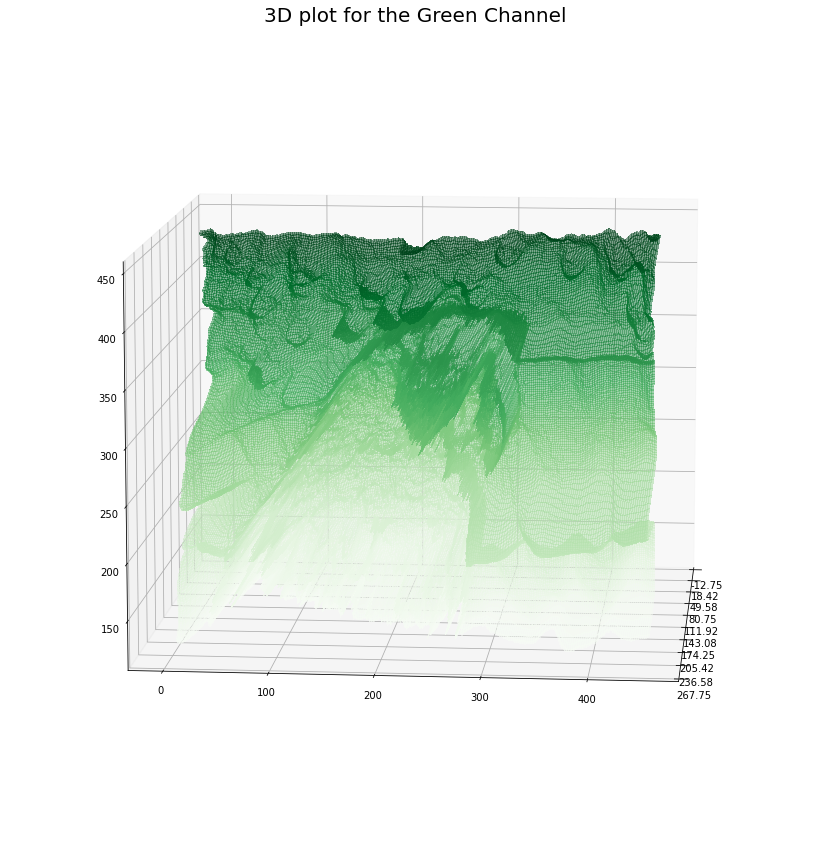

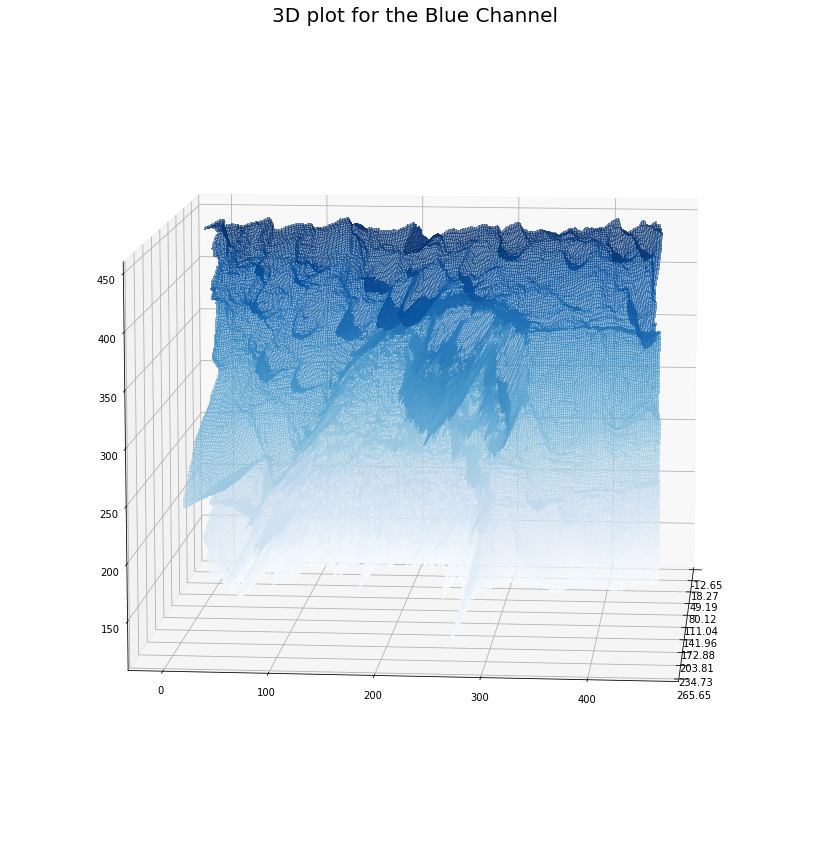

In [2]:
from skimage.io import imread
import numpy as np
import matplotlib.pylab as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter

def plot_3d(X, Y, Z, cmap='Reds', title=''):
    """
    This function plots 3D visualization of a channel
    It displays (x, y, f(x,y)) for all x,y values
    """ 

    fig = plt.figure(figsize=(15,15))
    ax = fig.gca(projection='3d')
    # Plot the surface.
    surf = ax.plot_surface(X, Y, Z, cmap=cmap, linewidth=0, antialiased=False, rstride=2, cstride=2, alpha=0.5)
    ax.xaxis.set_major_locator(LinearLocator(10))
    ax.xaxis.set_major_formatter(FormatStrFormatter('%.02f'))
    ax.view_init(elev=10., azim=5)
    ax.set_title(title, size=20)
    plt.show()
    
# Read the image
im = imread('../images/parrot.jpg')
Y = np.arange(im.shape[0])
X = np.arange(im.shape[1])
X, Y = np.meshgrid(X, Y)

Z1 = im[...,0]
Z2 = im[...,1]
Z3 = im[...,2]

# plot 3D visualizations of the R, G, B channels of the image respectively
plot_3d(Z1, X, im.shape[1]-Y, cmap='Reds', title='3D plot for the Red Channel')
plot_3d(Z2, X, im.shape[1]-Y, cmap='Greens', title='3D plot for the Green Channel')
plot_3d(Z3, X, im.shape[1]-Y, cmap='Blues', title='3D plot for the Blue Channel')

## Q-8: Use scikit-image's transform module's ProjectiveTransform to estimate the homography matrix from a source to a destination image and use the inverse() function to embed the Lena image (or yours) in the blank canvas

In [5]:
background = skimage.io.imread("../images/shutterstock.jpg")

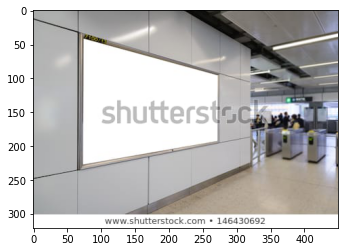

In [6]:
plt.imshow(background)

First task is to get the coordinates of the blank canvas in the given backgound image 

this can be done using this program - https://github.com/hardikkamboj/gmc

In [18]:
coordinates_background = np.float32([[75, 44], [272, 98], [272, 191], [74, 226]])

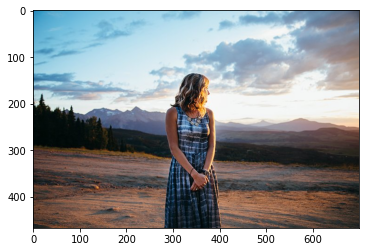

In [19]:
image = cv2.imread("potrait2.jpeg")
plt.imshow(image[:,:,::-1])

In [20]:
image.shape

(467, 700, 3)

In [21]:
image_coordinates = np.float32([[0,0], 
                    [0,700], 
                    [467,700],
                    [467,0]])

In [22]:
h, mask = cv2.findHomography(image_coordinates, coordinates_background, cv2.RANSAC,5.0)

In [23]:
h,w,c = image.shape

In [24]:
height, width, channels = background.shape
im1Reg = cv2.warpPerspective(image, h, (width, height))

error: OpenCV(4.5.2) /private/var/folders/24/8k48jl6d249_n_qfxwsl6xvm0000gn/T/pip-req-build-kkkcs6ro/opencv/modules/imgproc/src/imgwarp.cpp:3168: error: (-215:Assertion failed) (M0.type() == CV_32F || M0.type() == CV_64F) && M0.rows == 3 && M0.cols == 3 in function 'warpPerspective'


The first approach didn't quite work out well..

### Second appraoch

(220, 220, 3) (321, 450, 3)


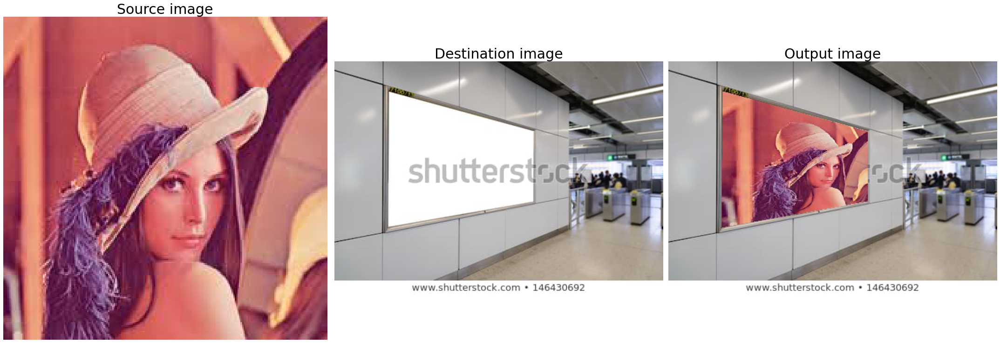

In [27]:
from skimage.transform import ProjectiveTransform
from skimage.io import imread
import numpy as np
import matplotlib.pylab as plt
from matplotlib.path import Path

im_src = imread('../images/lena.jpg');
im_dst = imread('../images/shutterstock.jpg')
print(im_src.shape, im_dst.shape)

pt = ProjectiveTransform()
width, height = im_src.shape[0], im_src.shape[1]
src = np.array([[   0.,    0.],
       [height-1,    0.],
       [height-1,  width-1],
       [   0.,  width-1]])
dst = np.array([[ 74.,  41.],
       [ 272.,  96.],
       [ 272.,  192.],
       [ 72.,  228.]])

pt.estimate(src, dst)

width, height = im_dst.shape[0], im_dst.shape[1]

polygon = dst
poly_path=Path(polygon)

x, y = np.mgrid[:height, :width]
coors=np.hstack((x.reshape(-1, 1), y.reshape(-1,1))) 

mask = poly_path.contains_points(coors)
mask = mask.reshape(height, width)

dst_indices = np.array([list(x) for x in list(zip(*np.where(mask > 0)))])
#print(dst_indices)
src_indices = np.round(pt.inverse(dst_indices), 0).astype(int)
src_indices[:,0], src_indices[:,1] = src_indices[:,1], src_indices[:,0].copy()
im_out = np.copy(im_dst)
im_out[dst_indices[:,1], dst_indices[:,0]] = im_src[src_indices[:,0], src_indices[:,1]]
plt.figure(figsize=(30,10))
plt.subplot(131), plt.imshow(im_src, cmap='gray'), plt.axis('off'), plt.title('Source image', size=30)
plt.subplot(132), plt.imshow(im_dst, cmap='gray'), plt.axis('off'), plt.title('Destination image', size=30)
plt.subplot(133), plt.imshow(im_out, cmap='gray'), plt.axis('off'), plt.title('Output image', size=30)
plt.tight_layout()
plt.show()